<img src="http://stemfellowship.org/wp-content/uploads/2016/10/STEMF-logo-blue-no-back-6.png" alt="STEM Fellowship" style="width:500px;height:120px;">

<h1 style="font-family:georgia;"><p style="text-align: center;"> Welcome to the R for Data Science Workshop! </p></h1>

The Big Data Challenge is a wonderful opporunity to learn new skills in a growing field of STEM, but we know how tough it can be to do something for the first time. These workshops were developed to help newcomers to coding and to Data Science grow comfortable with programming and the Data Science process.  
Have a burning question you want to ask? Feel free to contact us with any comments, questions, or concerns.  
Best wishes,  
The Data Science Team

## THE PROBLEM
An interesting fact about space launches is that solid-fuel rockets emit chlorine gas that can destroy the ozone in the stratosphere. If space travel is in our future, does that mean that the ozone layer is doomed?
Well, not necessarily. SpaceX rockets, for example, are liquid-fuel, and don't contain the chlorine that solid-fuel rockets do. They're also promising products in the development of space travel. To see if these rockets are the solution to ozone-friendly space travel, we can take a look at ozone levels over time and make note of when SpaceX launches occur.
Additionally, we can see if there's any other factors to look into with SpaceX Launches.

## SETUP
To download R, follow the instructions here.  
Recommended: RStudio is a user-friendly IDE for R. You can download it here.

## DATA
The first thing to do is to gather data. We want our data to comprise of SpaceX Launches and ozone concentrations. Since that combination is pretty specific, our best bet is to find data on ozone concentrations and data on SpaceX Launches, and then combine them.
For this data
We want data on SpaceX Launches first, so that's where we'll start!

R supports different types of data file types, but we'll be dealing with **.csv**, or comma-separated value files. Additionally, there are a few different ways of accessing data - using a direct link, downloading the data and referencing the file, or using an API. For this dataset, we can look at how to use to bring in SpaceX Launch data using a direct link.
The dataset we are referencing was [taken from Kaggle](https://www.kaggle.com/scoleman/spacex-launch-data) and can be found in the GitHub for the 2019 BDC Workshops [here](https://github.com/bigdatachallenge/2019_bdc_workshops/blob/master/spacex_launch_data.csv). In order for R to be able to interpret the data, we need it to be in raw format. You can access this format by pressing the 'Raw' button or by clicking [here](https://raw.githubusercontent.com/bigdatachallenge/2019_bdc_workshops/master/spacex_launch_data.csv).)
(By the way, now you know why it's called a comma-separated value file!)

So now we have a link!
https://github.com/bigdatachallenge/2019_bdc_workshops/blob/master/spacex_launch_data.csv

To start with, base R has a read.csv() function that can turn our data into a data frame. However, it tends to be slow and it has some drawbacks. We want to use a faster function to read our data. We'll have to use a **package**, or a collection of code, that allows us to do so. For R, this package is **readr**. We'll use **install.packages()** to install data.table, and then **library()** to get the code ready.

In [1]:
install.packages("readr", repos='http://cran.r-project.org', force=TRUE)
library("readr")

Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)
Warning message in download.packages(pkgs, destdir = tmpd, available = available, :
"download of package 'readr' failed"Warning message:
"package 'readr' was built under R version 3.4.4"

The data.table package has a nifty function called **read_csv()**. We can pass our link into it. Let's **store the data** into a **variable** called SpaceX_Launches.

In [2]:
SpaceX_Launches<-read_csv('https://raw.githubusercontent.com/bigdatachallenge/2019_bdc_workshops/master/spacex_launch_data.csv')

Parsed with column specification:
cols(
  `Flight Number` = col_character(),
  Date = col_date(format = ""),
  `Time (UTC)` = col_time(format = ""),
  `Booster Version` = col_character(),
  `Launch Site` = col_character(),
  Payload = col_character(),
  `Payload Mass (kg)` = col_character(),
  Orbit = col_character(),
  Customer = col_character(),
  `Mission Outcome` = col_character(),
  `Landing Outcome` = col_character()
)


We can take a look at the first six rows of our dataset using the **head()** function.

In [3]:
head(SpaceX_Launches)

Flight Number,Date,Time (UTC),Booster Version,Launch Site,Payload,Payload Mass (kg),Orbit,Customer,Mission Outcome,Landing Outcome
1,2010-06-04,18:45:00,F9 v1.0 B0003,CCAFS LC-40,Dragon Spacecraft Qualification Unit,NA,LEO,SpaceX,Success,Failure (parachute)
2,2010-12-08,15:43:00,F9 v1.0 B0004,CCAFS LC-40,"Dragon demo flight C1, two CubeSats, barrel of Brouère cheese",NA,LEO (ISS),NASA (COTS) NRO,Success,Failure (parachute)
3,2012-05-22,07:44:00,F9 v1.0 B0005,CCAFS LC-40,Dragon demo flight C2+,525,LEO (ISS),NASA (COTS),Success,No attempt
4,2012-10-08,00:35:00,F9 v1.0 B0006,CCAFS LC-40,SpaceX CRS-1,500,LEO (ISS),NASA (CRS),Success,No attempt
5,2013-03-01,15:10:00,F9 v1.0 B0007,CCAFS LC-40,SpaceX CRS-2,677,LEO (ISS),NASA (CRS),Success,No attempt
6,2013-09-29,16:00:00,F9 v1.1 B1003,VAFB SLC-4E,CASSIOPE,500,Polar LEO,MDA,Success,Uncontrolled (ocean)


Now that we have our data, we should get an idea of what our data contains. We can do this using the **summary()** function in base R.

In [4]:
summary(SpaceX_Launches)

 Flight Number           Date             Time (UTC)       Booster Version   
 Length:57          Min.   :2010-06-04   Length:57         Length:57         
 Class :character   1st Qu.:2015-02-11   Class1:hms        Class :character  
 Mode  :character   Median :2017-01-14   Class2:difftime   Mode  :character  
                    Mean   :2016-04-14   Mode  :numeric                      
                    3rd Qu.:2017-10-11                                       
                    Max.   :2018-06-04                                       
 Launch Site          Payload          Payload Mass (kg)     Orbit          
 Length:57          Length:57          Length:57          Length:57         
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
                                                                            
                                                                     

This gives us some insight into what our data is saying. We see that it spans the years from 2010 to 2018, with the median being at 2017. We can see there are fifty-seven flights recorded by the length indicated under each variable. We also see a a problem; the Payload Mass is a **character** value when it should probably be a **numeric** value.

With this insight, we are ready to start cleaning. Let's take a look at the Payload Mass column.

In [5]:
SpaceX_Launches$'Payload Mass (kg)'

[1] NA           NA           "525 "       "500 "       "677 "      
 [6] "500 "       "3,170 "     "3,325 "     "2,296 "     "1,316 "    
[11] "4,535 "     "4,428 "     "2,216 "     "2,395 "     "570 "      
[16] "4,159 "     "1,898 "     "4,707 "     "1,952 "     "2,034 "    
[21] "553 "       "5,271 "     "3,136 "     "4,696 "     "3,100 "    
[26] "3,600 "     "2,257 "     "4,600 "     "9,600 "     "2,490 "    
[31] "5,600 "     "5,300 "     "Classified" "6,070 "     "2,708 "    
[36] "3,669 "     "9,600 "     "6,761 "     "3,310 "     "475 "      
[41] "4,990 "     "9,600 "     "5,200 "     "3,500 "     "2,205 "    
[46] "9,600 "     "Classified" "4,230 "     "~1,250 "    "2,150 "    
[51] "6,092 "     "9,600 "     "2,647 "     "362 "       "3,600 "    
[56] "6,460 "     "5,384 "

We can immediately understand why the data is a character - there are 'Classified' values and a value that estimates with a tilde in front of it. Lastly, there are spaces at the end of every value. We can filter these out using the **gsub()** and **substring()** functions. 

In [6]:
SpaceX_Launches$'Payload Mass (kg)'<-gsub(",", "", SpaceX_Launches$'Payload Mass (kg)')
SpaceX_Launches$'Payload Mass (kg)'<-gsub(" ", "", SpaceX_Launches$'Payload Mass (kg)')
SpaceX_Launches$'Payload Mass (kg)'<-gsub("Classified", NA, SpaceX_Launches$'Payload Mass (kg)')
SpaceX_Launches$'Payload Mass (kg)'<-gsub("~", "", SpaceX_Launches$'Payload Mass (kg)')
SpaceX_Launches$'Payload Mass (kg)'<-substr(SpaceX_Launches$'Payload Mass (kg)', 1,nchar(SpaceX_Launches$'Payload Mass (kg)')-1)
SpaceX_Launches$'Payload Mass (kg)'

[1] NA     NA     "525"  "500"  "677"  "500"  "3170" "3325" "2296" "1316"
[11] "4535" "4428" "2216" "2395" "570"  "4159" "1898" "4707" "1952" "2034"
[21] "553"  "5271" "3136" "4696" "3100" "3600" "2257" "4600" "9600" "2490"
[31] "5600" "5300" NA     "6070" "2708" "3669" "9600" "6761" "3310" "475" 
[41] "4990" "9600" "5200" "3500" "2205" "9600" NA     "4230" "1250" "2150"
[51] "6092" "9600" "2647" "362"  "3600" "6460" "5384"

Now that the characters are all readable numbers, we can convert them to numeric values.

In [7]:
SpaceX_Launches$'Payload Mass (kg)'<-as.numeric(SpaceX_Launches$'Payload Mass (kg)')

All cleaned up! Now this is cleaner data. Maybe we can even plot it on a graph!

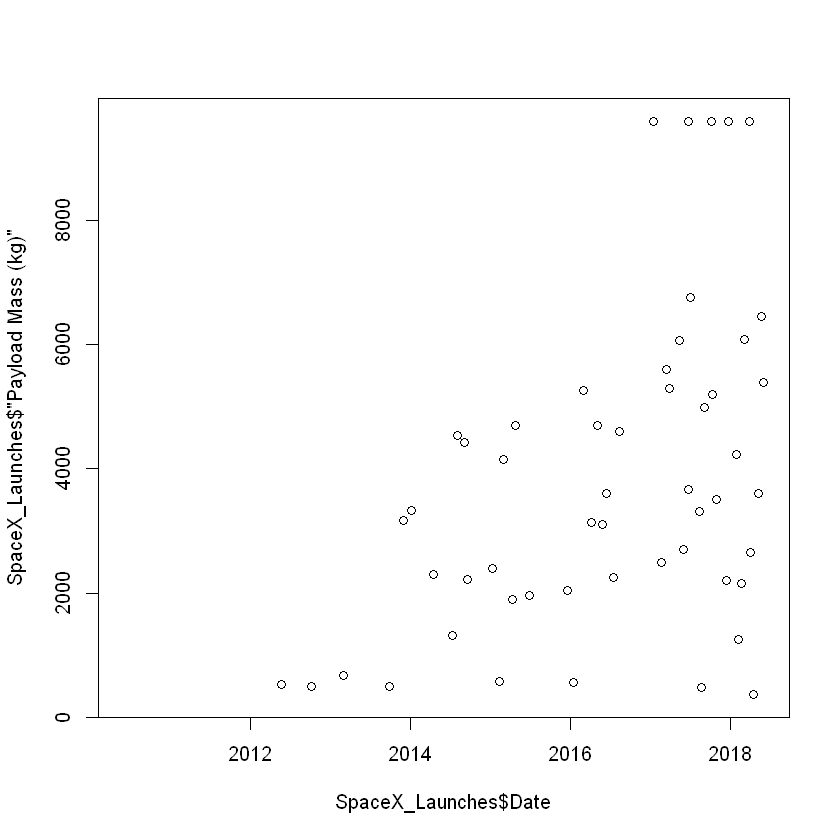

In [8]:
plot(SpaceX_Launches$Date,SpaceX_Launches$'Payload Mass (kg)')

As time goes on, SpaceX seems to have launched heavier and heavier rockets. Interesting!  
But let's not forget what we're here for - we want to look at the levels of ozone and compare them to rocket launch dates. So the first thing is to look at our ozone data. This time, the data is in folders that contain information on different types of gases. It'll be easier to download the data and import it by referencing the file. To do this easily...
1. Make a folder for your data to be in.

 *Name this folder something like 'Workshop Working Directory'.*
 
 
2. Extract the data into that folder.

 *Use a program like WinRAR (Windows) or the Archine Utility (Mac).*


3. Set that folder as your Working Directory.

 *To do this, use the setwd() function. If you're in RStudio, go to Session > Set Working Directory > Browse and browse to the folder.*

Take note: to use the setwd() function in Windows, the file path should contain double forward slashes instead of back slashes.

In [9]:
setwd('C://Users//Michal//Documents//2019//STEM//Workshop//Working Directory')

If you go to your working directoy folder, you'll see 'The Four Gases in Cohorts' has been extracted into a folder. Clicking on this takes you to... four more folders, each with the name of a different gas - Carbon Dioxide, Nitrogen Dioxide, Ozone, and Sulfur Dioxide. Clicking on the Ozone folder, you get a bunch of .csv files! There's way too many to work with. Luckily, each file corresponds to data in three-year intervals. To find out what data we should import, we can check to see the years the most common launches occured in.

To do this, we can use the sort() and the table () functions on the Date coloumn.

In [10]:
sort(table(as.numeric(format(as.Date(SpaceX_Launches$Date), '%Y'))),decreasing=TRUE)


2017 2018 2016 2015 2014 2013 2010 2012 
  18   11    8    7    6    3    2    2 

Conveniently (and somewhat predictably), the three years with the most flights are the three latest consecutive ones - 2016, 2017, and 2018. So, we can safely import the ozone data from years 2016-2018. Let's save it in a variable called Ozone_Data.

In [11]:
Ozone_Data<-read_csv('The Four Gases in Cohorts//Ozone//Ozone levels from 2016 to 2018.csv')

Parsed with column specification:
cols(
  .default = col_character(),
  State.Code = col_integer(),
  County.Code = col_integer(),
  Site.Num = col_integer(),
  Parameter.Code = col_integer(),
  POC = col_integer(),
  Latitude = col_double(),
  Longitude = col_double(),
  Date.Local = col_date(format = ""),
  Observation.Count = col_integer(),
  Observation.Percent = col_integer(),
  Arithmetic.Mean = col_double(),
  X1st.Max.Value = col_double(),
  X1st.Max.Hour = col_integer(),
  AQI = col_integer(),
  Date.of.Last.Change = col_date(format = "")
)
See spec(...) for full column specifications.


Fantastic! It seems that all the coloumns have been parsed. To take a peak at our data, we can use the **head()** function.

In [12]:
head(Ozone_Data)

State.Code,County.Code,Site.Num,Parameter.Code,POC,Latitude,Longitude,Datum,Parameter.Name,Sample.Duration,...,AQI,Method.Code,Method.Name,Local.Site.Name,Address,State.Name,County.Name,City.Name,CBSA.Name,Date.of.Last.Change
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,37,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,36,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,39,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,36,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,44,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04
1,3,10,44201,1,30.49748,-87.88026,NAD83,Ozone,8-HR RUN AVG BEGIN HOUR,...,44,NA,-,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE, ALABAMA",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2017-01-04


There seems to be a lot of coloumns - in fact, there's a '...', representing that the head() function skipped a few coloumns when showing the first six rows. This happens to datasets with a large number of coloumns.

To further our investigation, we can check the number of rows and the number of coloumns our dataset has with the **nrow()** and the **ncol()** functions respectively.

In [13]:
nrow(Ozone_Data)
ncol(Ozone_Data)

[1] 839893

[1] 29

That's a lot of coloumns! It's very unlikely that all of them are going to be useful to us. To check out the names of these coloumns, including the 'hidden' ones that the head() function isn't showing us, we can use the **names()** function.

In [14]:
names(Ozone_Data)

[1] "State.Code"          "County.Code"         "Site.Num"           
 [4] "Parameter.Code"      "POC"                 "Latitude"           
 [7] "Longitude"           "Datum"               "Parameter.Name"     
[10] "Sample.Duration"     "Pollutant.Standard"  "Date.Local"         
[13] "Units.of.Measure"    "Event.Type"          "Observation.Count"  
[16] "Observation.Percent" "Arithmetic.Mean"     "X1st.Max.Value"     
[19] "X1st.Max.Hour"       "AQI"                 "Method.Code"        
[22] "Method.Name"         "Local.Site.Name"     "Address"            
[25] "State.Name"          "County.Name"         "City.Name"          
[28] "CBSA.Name"           "Date.of.Last.Change"

How do we decide what stays and what we should keep? There seem to be an endless amount of choices! One way to lessen the load is to take a look at the **Readme** file for this dataset. The Readme file can be found [here](https://aqs.epa.gov/aqsweb/airdata/FileFormats.html#_daily_summary_files).

Reading it, it seems we want to keep location info, time info, and info the best summarizes the measurement of the day.

**Location Data**  
Things like 'Address' or 'City Name' might actually give us too much information, or information not easily worked with, so let's keep Longitude and Latitude. This is numeric data that is easier to quanitfy.
As well, the Readme file describes the Site.Num coloumn as _a unique number within the county identifying the site_, which could also be useful in singling out sites!
Lastly, to have something left to more easily compare the SpaceX Launch data, we'll leave in County data.

_Let's keep Site.Num, Latitude, Longitude, and County._

**Time Data**  
For this, we'll take the local date. Remember, this is the date according to local measurements, so we'd have to consider this if we want to work with timezones.

_Let's keep Date.Local._

**Measurements**  
There's a load of data here, but generally we can keep the measurements for the Arithmetic Mean of the ozone concentration, the units of measurements they're in (in case we have to convert) and, for the sake of investigation and interest, we can keep the Air Quality Index to compare the effect of ozone concentration.

_Let's keep Arithmetic.Mean and AQI._

In [15]:
Ozone_Data<-Ozone_Data[c('Site.Num', 'Latitude', 'Longitude', 'Date.Local', 'Units.of.Measure', 'Arithmetic.Mean', 'AQI', 'County.Name')]
head(Ozone_Data)

Site.Num,Latitude,Longitude,Date.Local,Units.of.Measure,Arithmetic.Mean,AQI,County.Name
10,30.49748,-87.88026,2016-03-01,Parts per million,0.034273,37,Baldwin
10,30.49748,-87.88026,2016-03-02,Parts per million,0.025294,36,Baldwin
10,30.49748,-87.88026,2016-03-03,Parts per million,0.033353,39,Baldwin
10,30.49748,-87.88026,2016-03-04,Parts per million,0.030059,36,Baldwin
10,30.49748,-87.88026,2016-03-05,Parts per million,0.032176,44,Baldwin
10,30.49748,-87.88026,2016-03-06,Parts per million,0.030000,44,Baldwin


In [16]:
length(unique(Ozone_Data$Site.Num))-length(unique(Ozone_Data$Latitude))

[1] -1030

In [17]:
unique(Ozone_Data$Units.of.Measure)

[1] "Parts per million"

In [18]:
Ozone_Data<-Ozone_Data[-c(1, 5)]
head(Ozone_Data)

Latitude,Longitude,Date.Local,Arithmetic.Mean,AQI,County.Name
30.49748,-87.88026,2016-03-01,0.034273,37,Baldwin
30.49748,-87.88026,2016-03-02,0.025294,36,Baldwin
30.49748,-87.88026,2016-03-03,0.033353,39,Baldwin
30.49748,-87.88026,2016-03-04,0.030059,36,Baldwin
30.49748,-87.88026,2016-03-05,0.032176,44,Baldwin
30.49748,-87.88026,2016-03-06,0.030000,44,Baldwin


In [19]:
names(Ozone_Data)[6]<-'County'

In [20]:
summary(Ozone_Data)

    Latitude       Longitude         Date.Local         Arithmetic.Mean    
 Min.   :18.18   Min.   :-158.09   Min.   :2016-01-01   Min.   :-0.000647  
 1st Qu.:34.09   1st Qu.:-110.60   1st Qu.:2016-07-15   1st Qu.: 0.024294  
 Median :38.34   Median : -92.01   Median :2017-01-29   Median : 0.032000  
 Mean   :37.62   Mean   : -95.47   Mean   :2017-01-22   Mean   : 0.032082  
 3rd Qu.:41.00   3rd Qu.: -82.13   3rd Qu.:2017-07-26   3rd Qu.: 0.039529  
 Max.   :64.85   Max.   : -65.92   Max.   :2018-05-13   Max.   : 0.105176  
      AQI            County         
 Min.   :  0.00   Length:839893     
 1st Qu.: 31.00   Class :character  
 Median : 37.00   Mode  :character  
 Mean   : 39.85                     
 3rd Qu.: 44.00                     
 Max.   :233.00                     

In [21]:
outliers<-Ozone_Data[Ozone_Data$Arithmetic.Mean<0,]

In [22]:
head(outliers)

Latitude,Longitude,Date.Local,Arithmetic.Mean,AQI,County
41.20796,-95.9459,2017-10-05,-0.000647,0,Douglas


In [23]:
Ozone_Data<-Ozone_Data[-Ozone_Data$Arithmetic.Mean<0,]

In [24]:
summary(Ozone_Data)

    Latitude       Longitude         Date.Local         Arithmetic.Mean   
 Min.   :18.18   Min.   :-158.09   Min.   :2016-01-01   Min.   :0.000059  
 1st Qu.:34.10   1st Qu.:-110.60   1st Qu.:2016-07-15   1st Qu.:0.024353  
 Median :38.34   Median : -92.01   Median :2017-01-29   Median :0.032000  
 Mean   :37.62   Mean   : -95.47   Mean   :2017-01-22   Mean   :0.032103  
 3rd Qu.:41.00   3rd Qu.: -82.13   3rd Qu.:2017-07-25   3rd Qu.:0.039529  
 Max.   :64.85   Max.   : -65.92   Max.   :2018-05-13   Max.   :0.105176  
      AQI            County         
 Min.   :  1.00   Length:839357     
 1st Qu.: 31.00   Class :character  
 Median : 37.00   Mode  :character  
 Mean   : 39.88                     
 3rd Qu.: 44.00                     
 Max.   :233.00                     

Let's take a look at the standard deviation of our ozone measurements.

In [25]:
sd(Ozone_Data$Arithmetic.Mean)

[1] 0.01106837

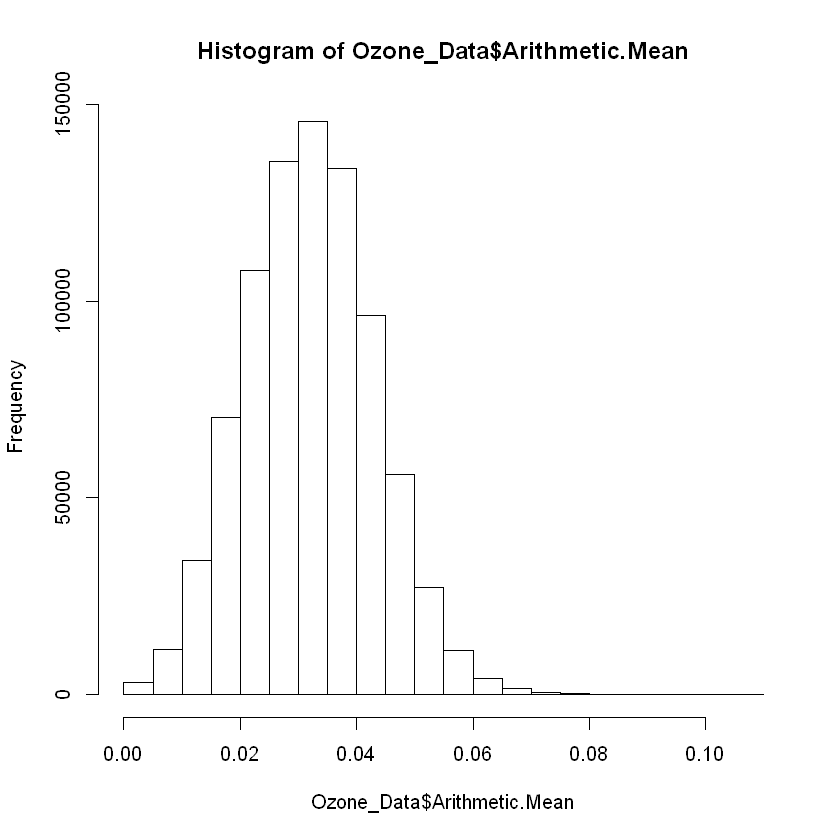

In [26]:
hist(Ozone_Data$Arithmetic.Mean)

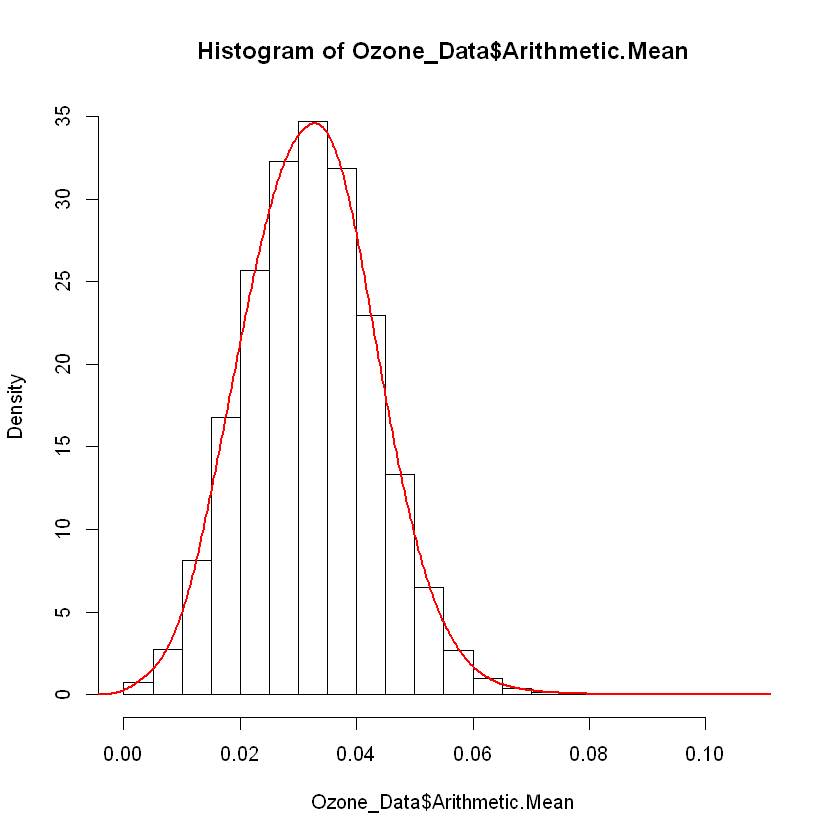

In [27]:
hist(Ozone_Data$Arithmetic.Mean, prob=TRUE)
lines(density(Ozone_Data$Arithmetic.Mean, adjust=3), col="red", lwd=2) 

In [28]:
cor(Ozone_Data$Arithmetic.Mean, Ozone_Data$AQI)

[1] 0.8012037

In [29]:
install.packages("tidyverse", dependencies=TRUE, repos='http://cran.utstat.utoronto.ca/')
install.packages("bindrcpp", dependencies=TRUE, repos='http://cran.utstat.utoronto.ca/')
library(tidyverse)

Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)


package 'tidyverse' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Michal\AppData\Local\Temp\RtmpUxcllp\downloaded_packages


Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)


package 'bindrcpp' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Michal\AppData\Local\Temp\RtmpUxcllp\downloaded_packages


Warning message:
"package 'tidyverse' was built under R version 3.4.4"-- Attaching packages --------------------------------------- tidyverse 1.2.1 --
v ggplot2 3.0.0     v purrr   0.2.5
v tibble  1.4.2     v dplyr   0.7.4
v tidyr   0.8.1     v stringr 1.2.0
v ggplot2 3.0.0     v forcats 0.2.0
Warning message:
"package 'ggplot2' was built under R version 3.4.4"Warning message:
"package 'tibble' was built under R version 3.4.4"Warning message:
"package 'tidyr' was built under R version 3.4.4"Warning message:
"package 'purrr' was built under R version 3.4.4"-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()


In [30]:
unique(SpaceX_Launches$'Launch Site')

[1] "CCAFS LC-40"  "VAFB SLC-4E"  "KSC LC-39A"   "CCAFS SLC-40"

There are only three sites here! In order to link our datasets geographically, we can find out what counties these sites are in and then create a new coloumn.

In [31]:
SpaceX_Launches<-transform(SpaceX_Launches, County=ifelse(SpaceX_Launches$'Launch Site'=='VAFB SLC-4E', 
                                         'Santa Barbara', 
                                         'Brevard'
                                        ))

In [32]:
names(Ozone_Data)[3]<-'Date'

In [33]:
SB_Ozone<-Ozone_Data[Ozone_Data$County=='Santa Barbara',]
Brevard_Ozone<-Ozone_Data[Ozone_Data$County=='Brevard',]

In [34]:
head(Brevard_Ozone)

Latitude,Longitude,Date,Arithmetic.Mean,AQI,County
28.05361,-80.62861,2016-01-01,0.021706,24,Brevard
28.05361,-80.62861,2016-01-02,0.023471,25,Brevard
28.05361,-80.62861,2016-01-03,0.024294,24,Brevard
28.05361,-80.62861,2016-01-04,0.035824,36,Brevard
28.05361,-80.62861,2016-01-05,0.042235,40,Brevard
28.05361,-80.62861,2016-01-06,0.036824,39,Brevard


In [35]:
Brevard_Launches<-SpaceX_Launches[SpaceX_Launches$County=='Brevard',]
SB_Launches<-SpaceX_Launches[SpaceX_Launches$County=='Santa Barbara',]

In [36]:
library(ggplot2)

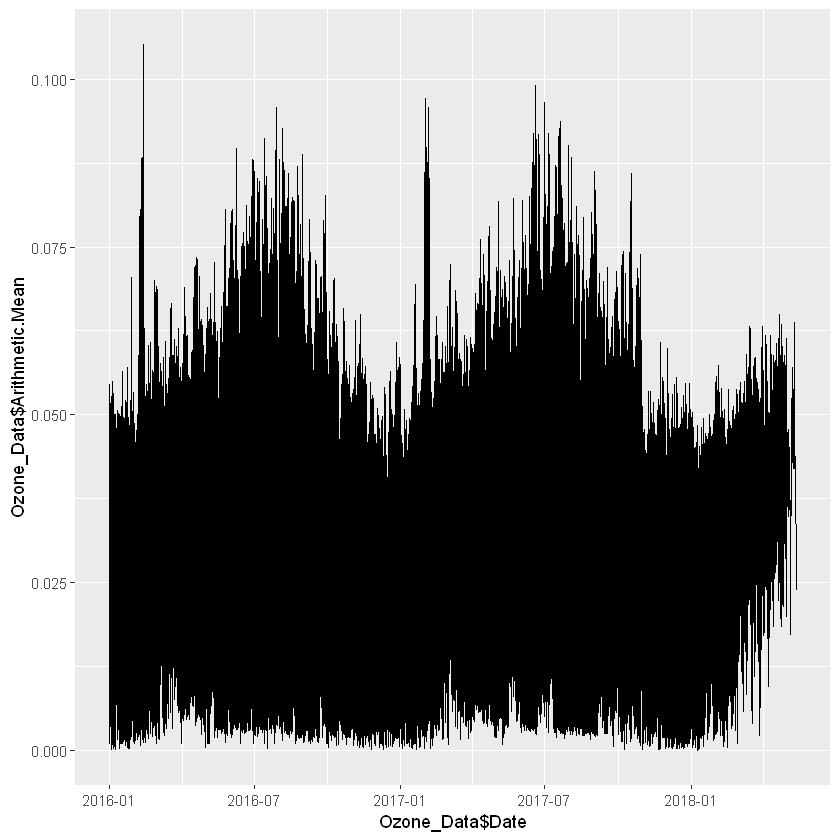

In [37]:
ggplot(data=Ozone_Data, aes(x=Ozone_Data$Date, y=Ozone_Data$'Arithmetic.Mean')) + geom_line()

In [38]:
agg_Ozone<-aggregate(Arithmetic.Mean~Date, Ozone_Data, mean)

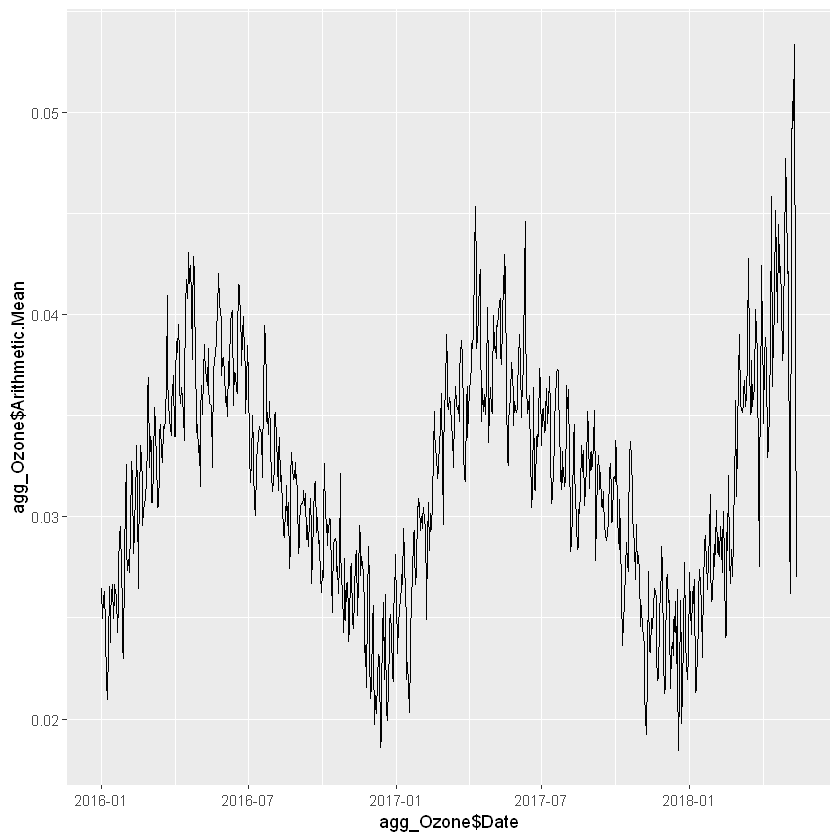

In [39]:
ggplot(data=agg_Ozone, aes(x=agg_Ozone$Date, y=agg_Ozone$'Arithmetic.Mean')) + 
geom_line()

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


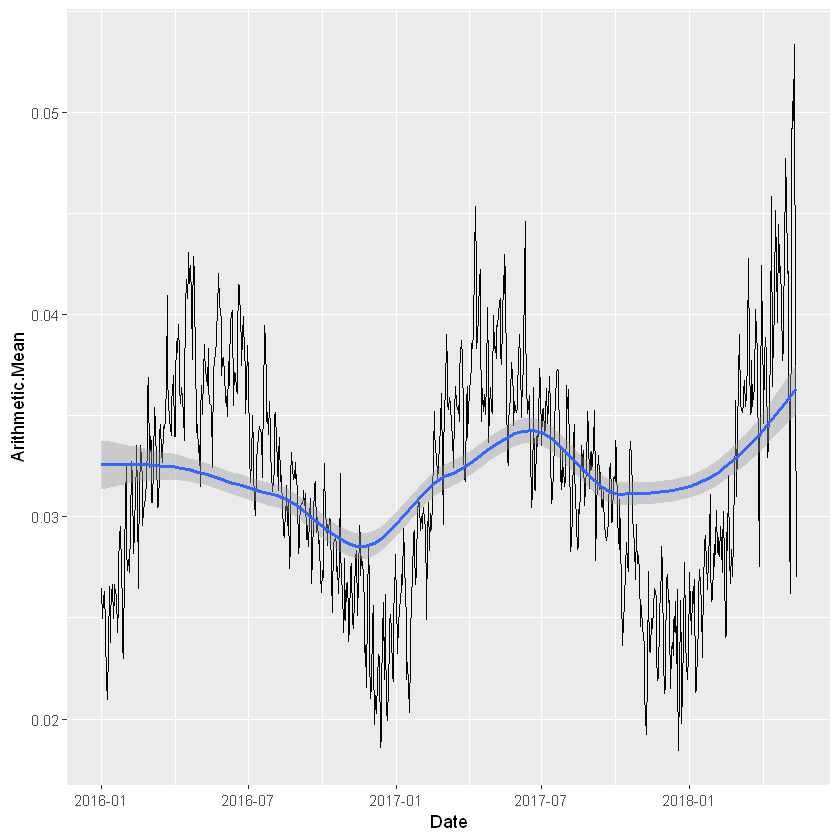

In [40]:
ggplot(data=agg_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_smooth()

In [41]:
install.packages('plotly', repos='http://cran.r-project.org')
library(plotly)

Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)


package 'plotly' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Michal\AppData\Local\Temp\RtmpUxcllp\downloaded_packages


Warning message:
"package 'plotly' was built under R version 3.4.4"
Attaching package: 'plotly'

The following object is masked from 'package:ggplot2':

    last_plot

The following object is masked from 'package:stats':

    filter

The following object is masked from 'package:graphics':

    layout



`geom_smooth()` using method = 'loess' and formula 'y ~ x'


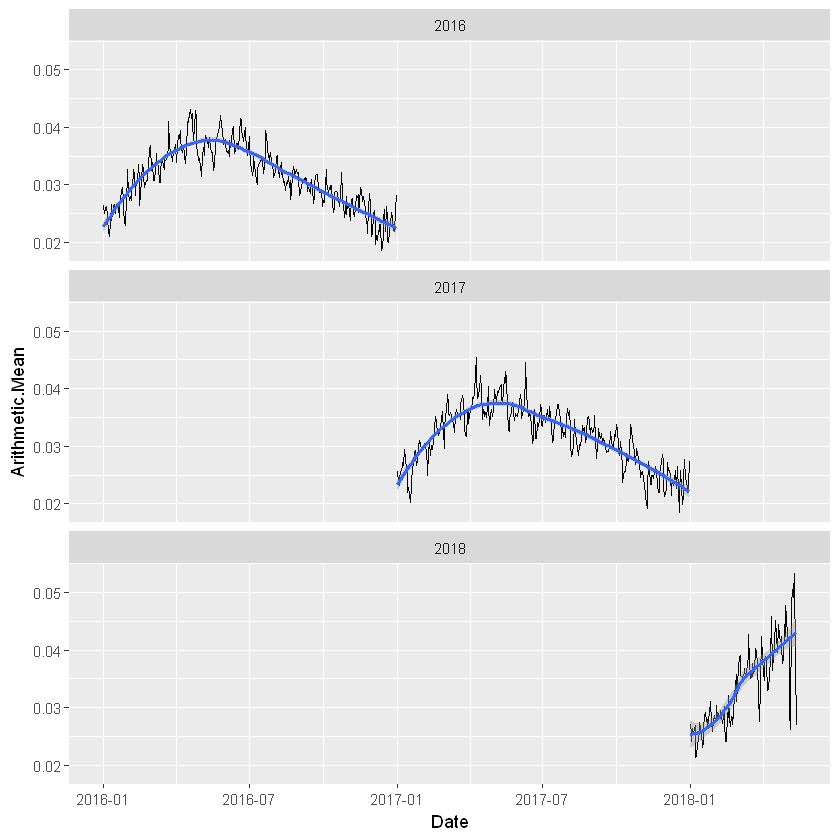

In [42]:
ggplot(data=agg_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_smooth() +
facet_wrap(~format(as.Date(Date, "Y/%M/%D"), '%Y'), ncol=1)

In [43]:
myPlot<-ggplot(data=agg_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_smooth() +
facet_wrap(~format(as.Date(Date, "Y/%M/%D"), '%Y'), ncol=1)

ggplotly(myPlot)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


HTML widgets cannot be represented in plain text (need html)

In [44]:
install.packages("ggmap", repos='http://cran.r-project.org', force=TRUE)
library("ggmap")

Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)
Warning message in download.packages(pkgs, destdir = tmpd, available = available, :
"download of package 'ggmap' failed"Warning message:
"package 'ggmap' was built under R version 3.4.4"
Attaching package: 'ggmap'

The following object is masked from 'package:plotly':

    wind



In [45]:
head(Ozone_Data)

Latitude,Longitude,Date,Arithmetic.Mean,AQI,County
30.49748,-87.88026,2016-03-01,0.034273,37,Baldwin
30.49748,-87.88026,2016-03-02,0.025294,36,Baldwin
30.49748,-87.88026,2016-03-03,0.033353,39,Baldwin
30.49748,-87.88026,2016-03-04,0.030059,36,Baldwin
30.49748,-87.88026,2016-03-05,0.032176,44,Baldwin
30.49748,-87.88026,2016-03-06,0.030000,44,Baldwin


In [46]:
myMap<-get_map(location='United States',zoom=4)

Map from URL : http://maps.googleapis.com/maps/api/staticmap?center=United+States&zoom=4&size=640x640&scale=2&maptype=terrain&language=en-EN&sensor=false
Information from URL : http://maps.googleapis.com/maps/api/geocode/json?address=United%20States&sensor=false


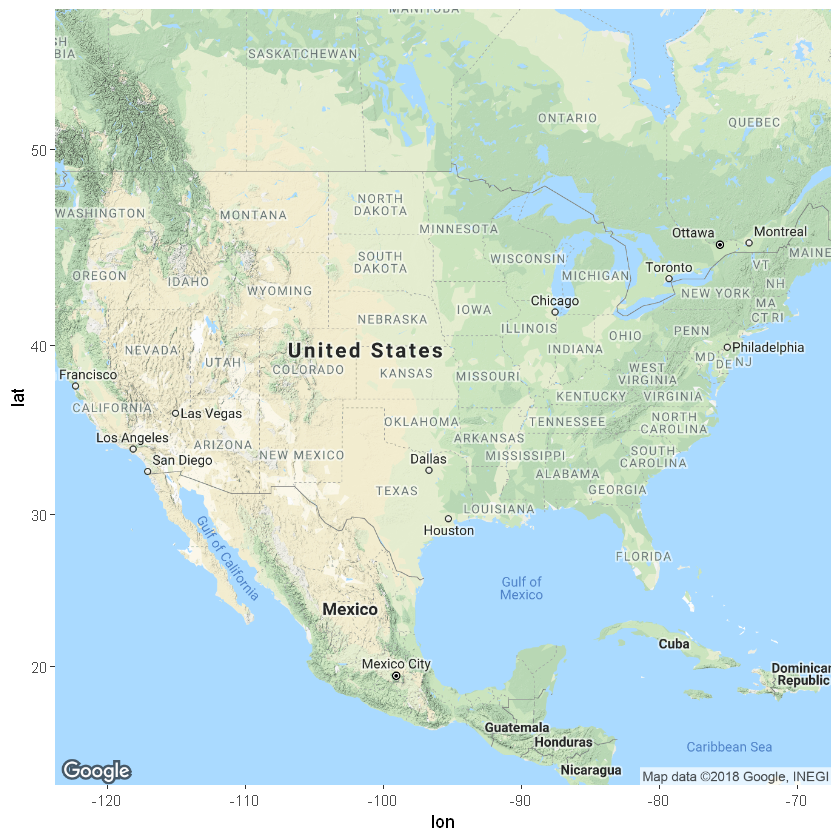

In [47]:
ggmap(myMap)

Warning message:
"Removed 7946 rows containing missing values (geom_point)."

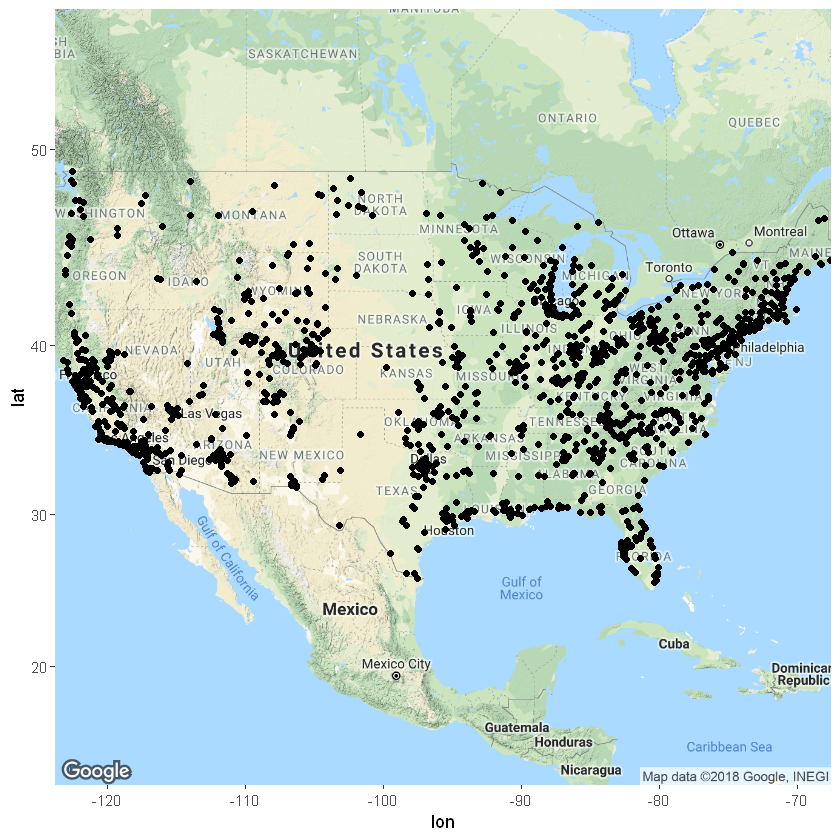

In [48]:
ggmap(myMap)+
geom_point(data=Ozone_Data, aes(x=Longitude, y=Latitude))

In [49]:
set.seed(42)

In [50]:
clusters<-kmeans(Ozone_Data[c('Longitude', 'Latitude')], 6)

In [51]:
names(clusters)

[1] "cluster"      "centers"      "totss"        "withinss"     "tot.withinss"
[6] "betweenss"    "size"         "iter"         "ifault"

In [52]:
length(clusters$cluster)

[1] 839357

In [53]:
Ozone_Data[ncol(Ozone_Data)+1]<-clusters$cluster

In [54]:
head(Ozone_Data)

Latitude,Longitude,Date,Arithmetic.Mean,AQI,County,V7
30.49748,-87.88026,2016-03-01,0.034273,37,Baldwin,5
30.49748,-87.88026,2016-03-02,0.025294,36,Baldwin,5
30.49748,-87.88026,2016-03-03,0.033353,39,Baldwin,5
30.49748,-87.88026,2016-03-04,0.030059,36,Baldwin,5
30.49748,-87.88026,2016-03-05,0.032176,44,Baldwin,5
30.49748,-87.88026,2016-03-06,0.030000,44,Baldwin,5


In [55]:
names(Ozone_Data)[7]<-'Zone'

Warning message:
"Removed 7946 rows containing missing values (geom_point)."

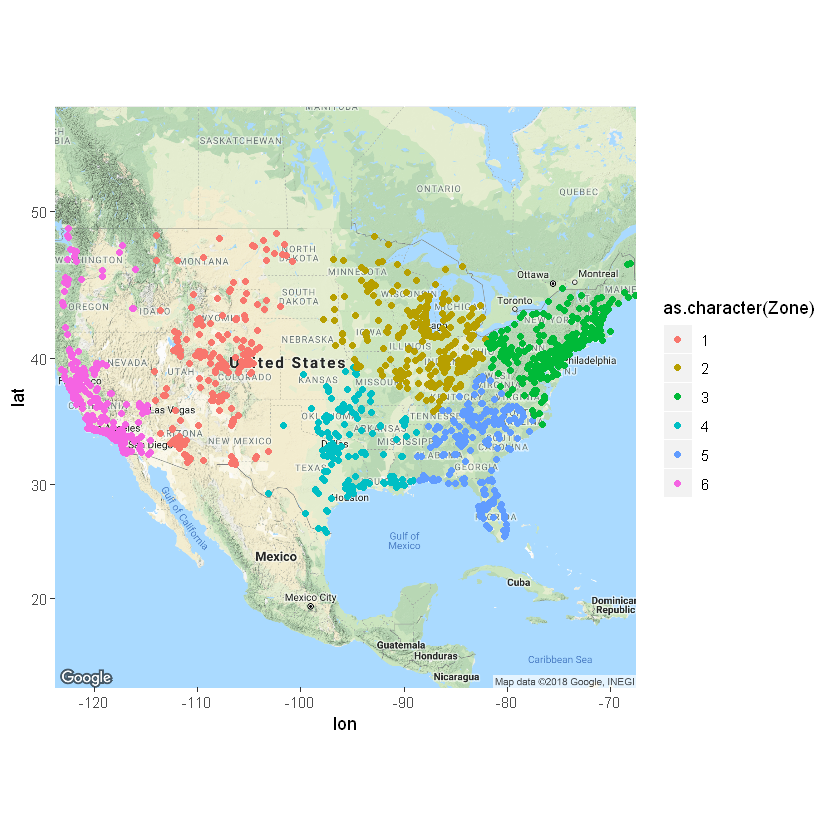

In [56]:
ggmap(myMap)+
geom_point(data=Ozone_Data, aes(x=Longitude, y=Latitude, col=as.character(Zone)))

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'


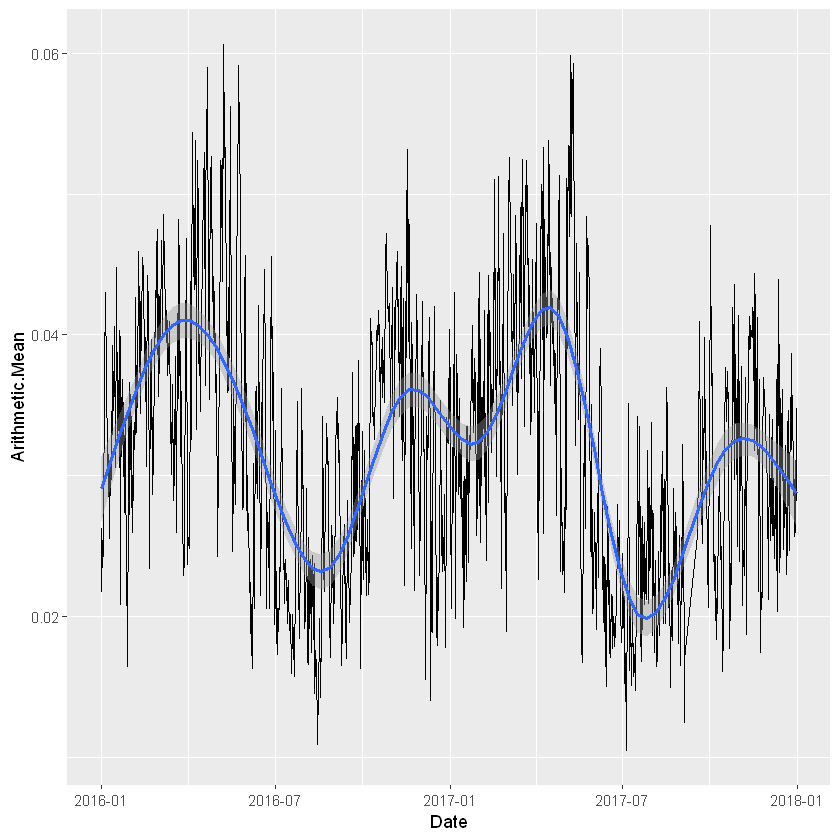

In [57]:
ggplot(data=Brevard_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_smooth()

In [58]:
Brevard_Ozone<-(aggregate(Arithmetic.Mean~Date, Brevard_Ozone, mean))

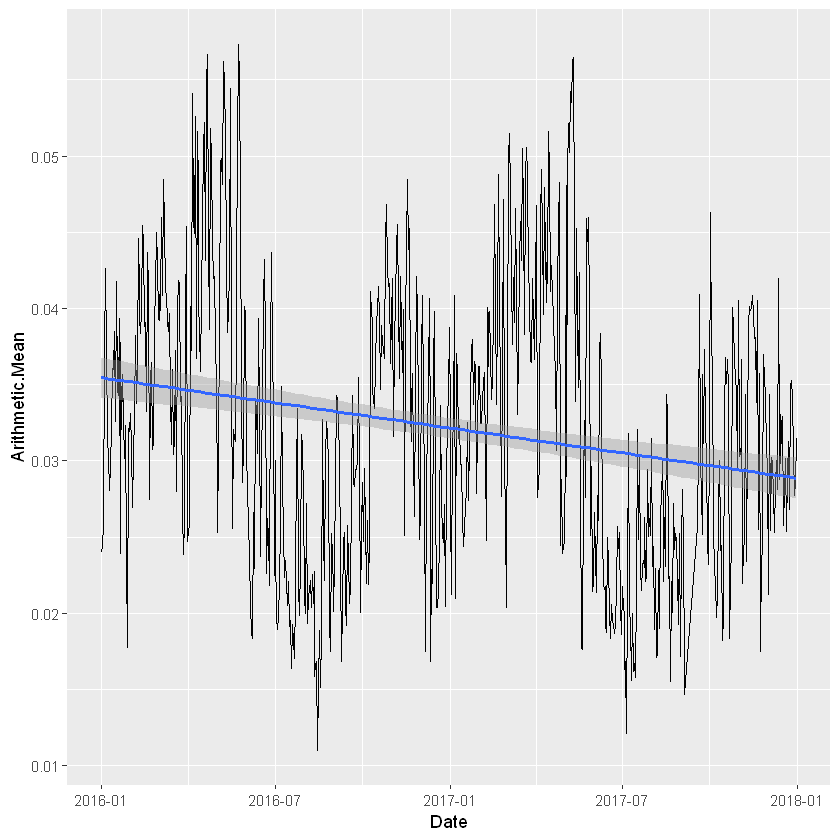

In [59]:
ggplot(data=Brevard_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_smooth(method='lm')

In [60]:
Brev_Ozone_Launch<-merge(Brevard_Ozone, Brevard_Launches, by='Date')

Warning message:
"Ignoring unknown aesthetics: label"

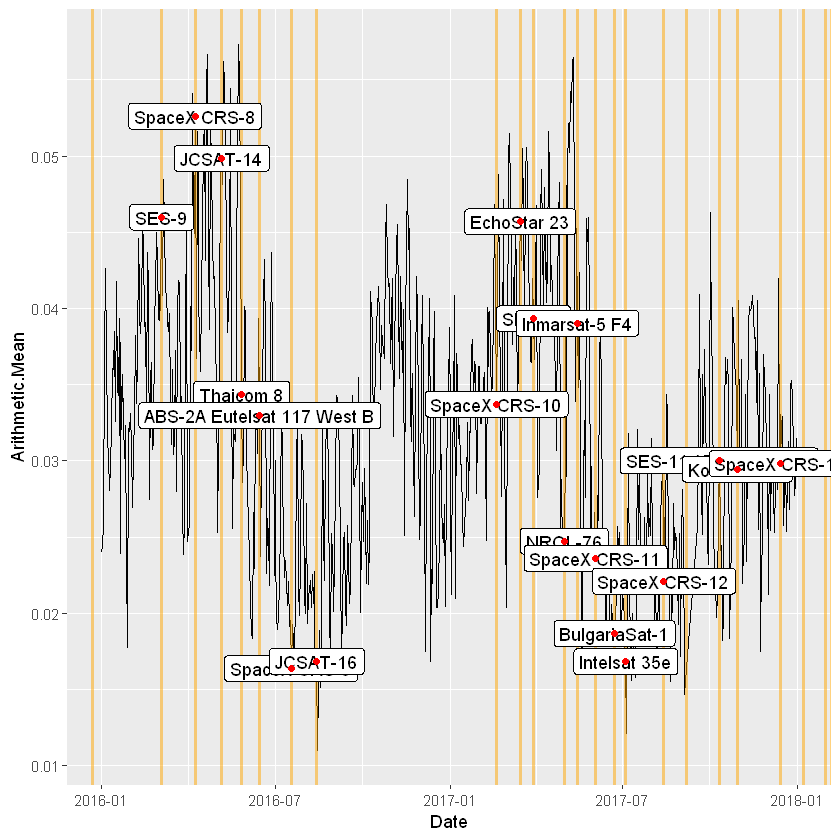

In [61]:
ggplot(data=Brevard_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
geom_vline(data=Brevard_Launches, aes(xintercept=Date), col='orange', size=1, alpha=0.5) +
geom_label(data=Brev_Ozone_Launch, aes(x=Date, y=Arithmetic.Mean, label=Payload)) +
geom_point(data=Brev_Ozone_Launch, aes(x=Date, y=Arithmetic.Mean, label=Payload), col='red')

In [62]:
install.packages("ggrepel", repos='http://cran.utstat.utoronto.ca/')
library(ggrepel)

Installing package into 'C:/Users/Michal/Documents/R/win-library/3.4'
(as 'lib' is unspecified)


package 'ggrepel' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\Michal\AppData\Local\Temp\RtmpUxcllp\downloaded_packages


Warning message:
"package 'ggrepel' was built under R version 3.4.4"

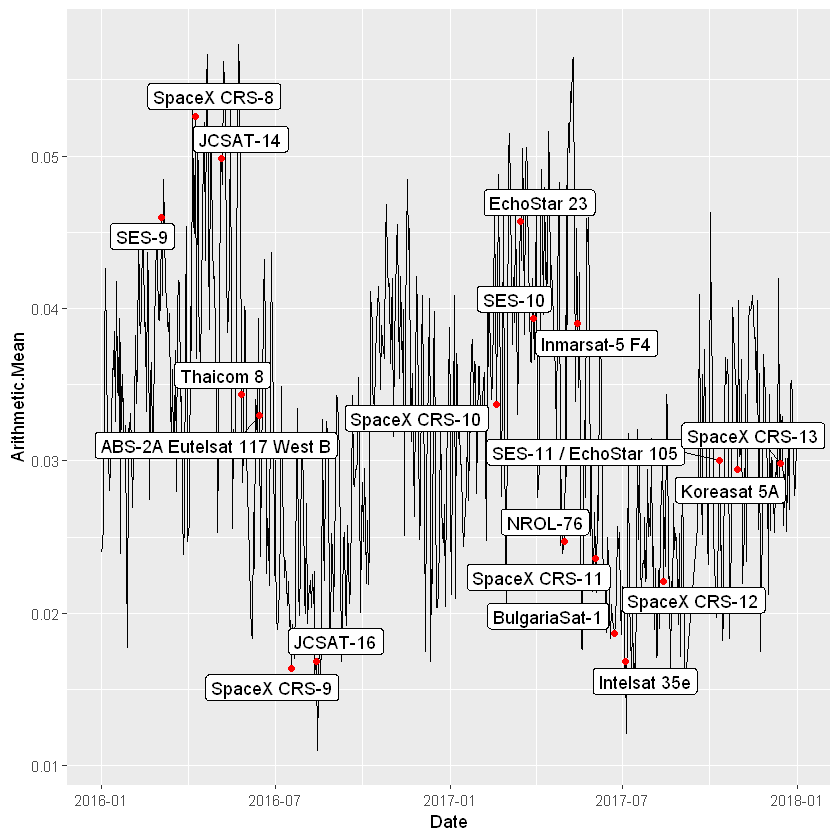

In [63]:
myPlot2<-ggplot(data=Brevard_Ozone, aes(x=Date, y=Arithmetic.Mean)) + 
geom_line() + 
#geom_vline(data=Brevard_Launches, aes(xintercept=Date), col='orange', size=1, alpha=0.5) +
geom_label_repel(data=Brev_Ozone_Launch, aes(x=Date, y=Arithmetic.Mean, label=Payload)) +
geom_point(data=Brev_Ozone_Launch, aes(x=Date, y=Arithmetic.Mean), col='red')
myPlot2

In [64]:
ggplotly(myPlot2)

Warning message in geom2trace.default(dots[[1L]][[1L]], dots[[2L]][[1L]], dots[[3L]][[1L]]):
"geom_GeomLabelRepel() has yet to be implemented in plotly.
  If you'd like to see this geom implemented,
  Please open an issue with your example code at
  https://github.com/ropensci/plotly/issues"

HTML widgets cannot be represented in plain text (need html)

Is it safe to say that SpaceX Launches *do* cause a decrease in ozone? Not really. It seems we might want to take a closer look time-wise. Conveniently, we already have ozone data in hourly format! Let's import it now for the Brevard County.

In [65]:
Brevard_Hourly<-read_csv('2017 Hourly Brevard Data.csv')
head(Brevard_Hourly)

Parsed with column specification:
cols(
  Latitude = col_double(),
  Longitude = col_double(),
  `Local Datetime (EDT)` = col_character(),
  `Sample Measurement (ppm)` = col_double()
)


Latitude,Longitude,Local Datetime (EDT),Sample Measurement (ppm)
28.05361,-80.62861,2017-01-01 5:00,0.007
28.31084,-80.61533,2017-01-01 5:00,0.032
28.05361,-80.62861,2017-01-01 6:00,0.006
28.31084,-80.61533,2017-01-01 6:00,0.026
28.05361,-80.62861,2017-01-01 7:00,0.002
28.31084,-80.61533,2017-01-01 7:00,0.023


Hmm... what an interesting dataset!

In [66]:
summary(Brevard_Hourly)

    Latitude       Longitude      Local Datetime (EDT) Sample Measurement (ppm)
 Min.   :28.05   Min.   :-80.63   Length:16285         Min.   :0.0000          
 1st Qu.:28.05   1st Qu.:-80.63   Class :character     1st Qu.:0.0210          
 Median :28.05   Median :-80.63   Mode  :character     Median :0.0300          
 Mean   :28.18   Mean   :-80.62                        Mean   :0.0305          
 3rd Qu.:28.31   3rd Qu.:-80.62                        3rd Qu.:0.0390          
 Max.   :28.31   Max.   :-80.62                        Max.   :0.0750          
 NA's   :10      NA's   :10                            NA's   :10              

In [67]:
class(Brevard_Hourly$'Local Datetime (EDT)')

[1] "character"

In [68]:
Brevard_Hourly$'Local Datetime (EDT)'<-as.POSIXct(strptime(Brevard_Hourly$'Local Datetime (EDT)', format="%Y-%m-%d %H:%M"))

In [69]:
summary(Brevard_Hourly)

    Latitude       Longitude      Local Datetime (EDT)         
 Min.   :28.05   Min.   :-80.63   Min.   :2017-01-01 05:00:00  
 1st Qu.:28.05   1st Qu.:-80.63   1st Qu.:2017-03-28 08:00:00  
 Median :28.05   Median :-80.63   Median :2017-06-21 19:00:00  
 Mean   :28.18   Mean   :-80.62   Mean   :2017-06-26 12:38:02  
 3rd Qu.:28.31   3rd Qu.:-80.62   3rd Qu.:2017-10-01 01:00:00  
 Max.   :28.31   Max.   :-80.62   Max.   :2017-12-31 23:00:00  
 NA's   :10      NA's   :10       NA's   :12                   
 Sample Measurement (ppm)
 Min.   :0.0000          
 1st Qu.:0.0210          
 Median :0.0300          
 Mean   :0.0305          
 3rd Qu.:0.0390          
 Max.   :0.0750          
 NA's   :10              

In [70]:
Launches17<-Brevard_Launches[format(as.Date(Brevard_Launches$Date, "Y/%M/%D"), '%Y')=='2017',]

In [71]:
nrow(Launches17)

[1] 13

In [72]:
names(Brevard_Hourly)[c(3,4)]<-c('Datetime', 'Measurement')

In [73]:
Launches17<-transform(Launches17, Datetime=as.character(paste(Date, Time..UTC.)))

In [74]:
times<-as.POSIXct(Launches17$Datetime, tz='GMT')
attributes(times)$tzone<-'EST'
Launches17$Datetime<-times

In [75]:
class(Brevard_Hourly$Datetime)

[1] "POSIXct" "POSIXt"

Warning message:
"Removed 12 rows containing missing values (geom_path)."

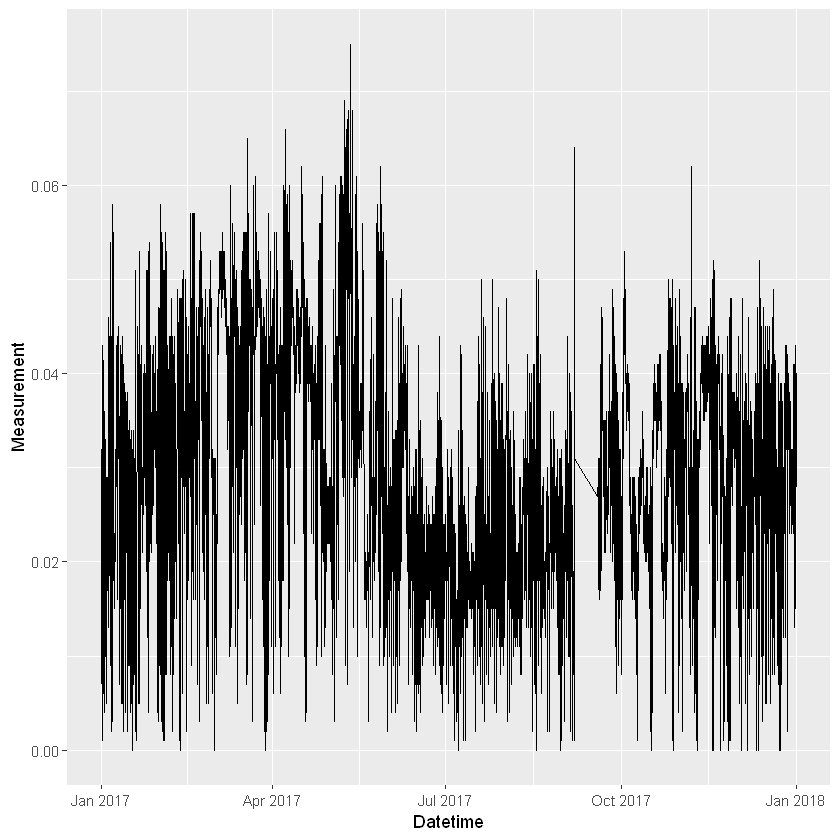

In [76]:
ggplot(data=Brevard_Hourly, aes(x=Datetime, y=Measurement)) +
geom_line()

In [77]:
Brevard_Hourly<-aggregate(Measurement~Datetime, Brevard_Hourly, mean)

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'


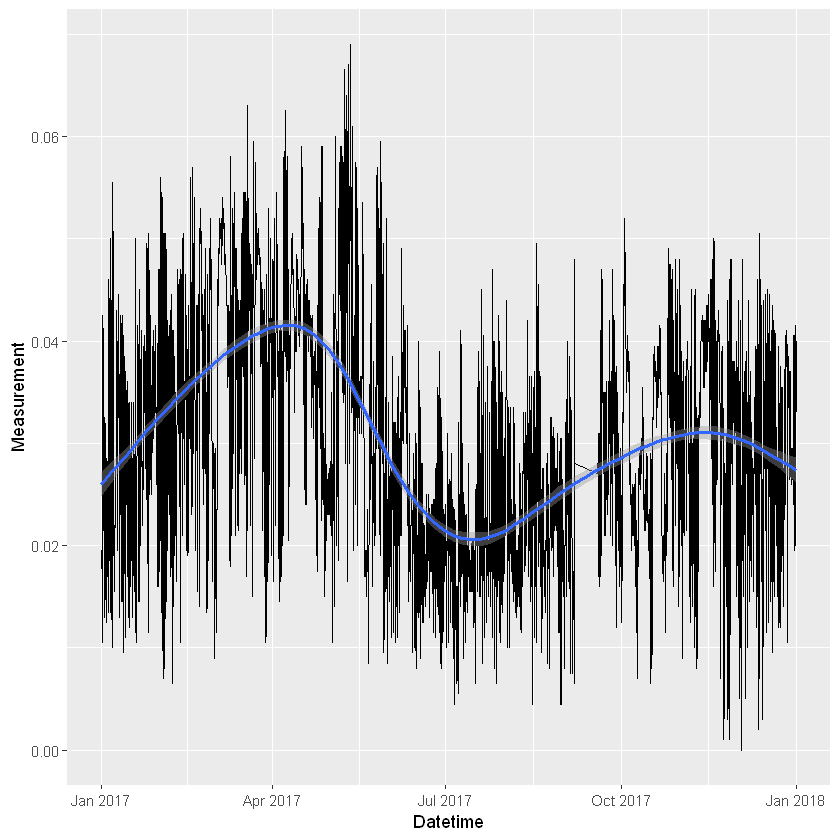

In [78]:
ggplot(data=Brevard_Hourly, aes(x=Datetime, y=Measurement)) +
geom_line() +
geom_smooth()

In [79]:
start<-Launches17$Datetime

In [80]:
end<-start+1*60*60*12

In [81]:
rects<-data.frame(start, end)

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'


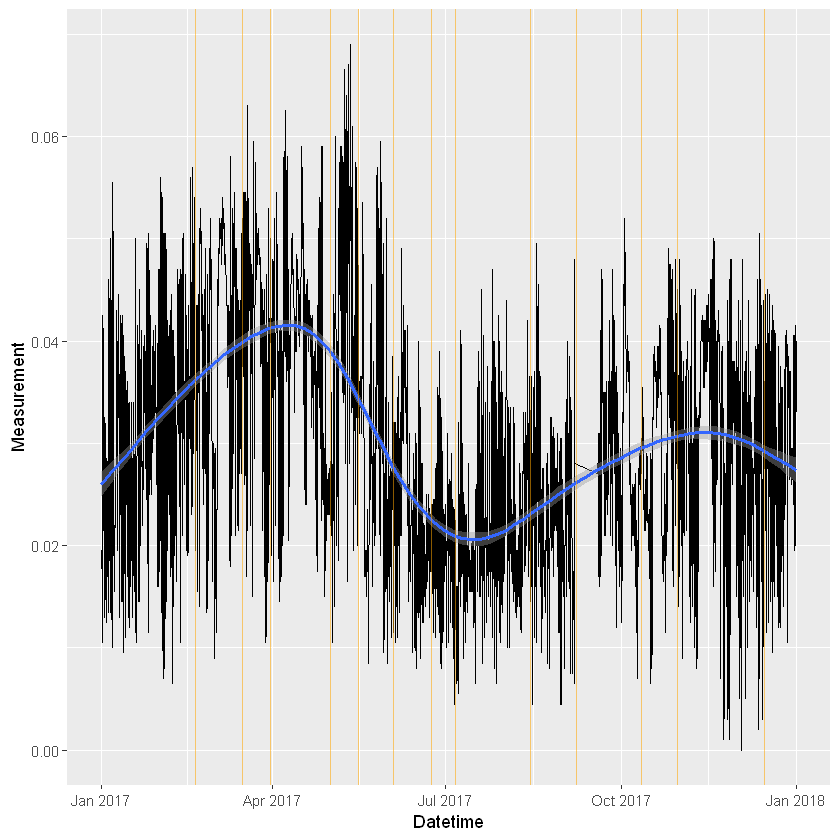

In [82]:
ggplot(data=Brevard_Hourly, aes(x=Datetime, y=Measurement)) +
geom_line() +
geom_smooth()+
geom_rect(data=rects, inherit.aes=FALSE, aes(xmin=start, xmax=end, ymin=-Inf,
                ymax=Inf), color="transparent", fill="orange", alpha=0.55)

In [83]:
lower<-as.character(as.Date(start[1])-1)
upper<-as.character(as.Date(start[1])+2)

In [84]:
First_Ozone<-Brevard_Hourly[Brevard_Hourly$Datetime>=lower & Brevard_Hourly$Datetime<=upper,]

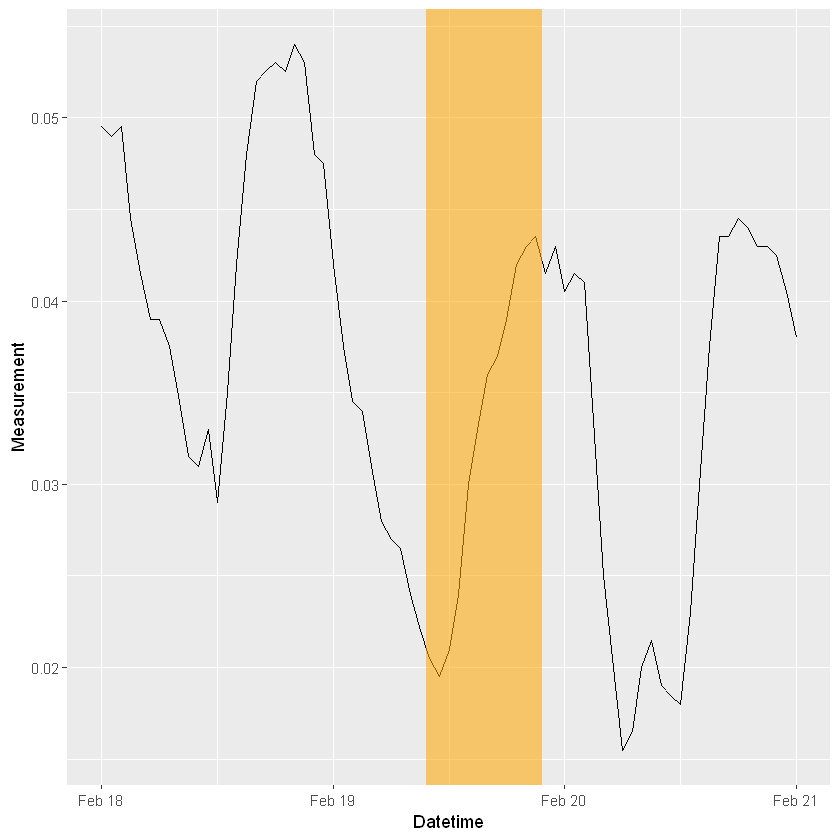

In [85]:
ggplot(data=First_Ozone, aes(x=Datetime, y=Measurement)) +
geom_line() +
geom_rect(data=rects[1,], inherit.aes=FALSE, aes(xmin=start, xmax=end, ymin=-Inf,
                ymax=Inf), color="transparent", fill="orange", alpha=0.55)

In [86]:
visualizr<-function(index)
{
    lower<-as.character(as.Date(start[index])-1)
    upper<-as.character(as.Date(start[index])+2)
    Index_Ozone<-Brevard_Hourly[Brevard_Hourly$Datetime>=lower & Brevard_Hourly$Datetime<=upper,]
    
    myPlot3 <- ggplot(data=Index_Ozone, aes(x=Datetime, y=Measurement)) +
    geom_line() +
    geom_rect(data=rects[index,], inherit.aes=FALSE, aes(xmin=start, xmax=end, ymin=-Inf,
                ymax=Inf), color="transparent", fill="orange", alpha=0.5) +
    geom_vline(xintercept=start[index], col='navy', size=1.5, alpha=0.5)
    
    return(myPlot3)
}

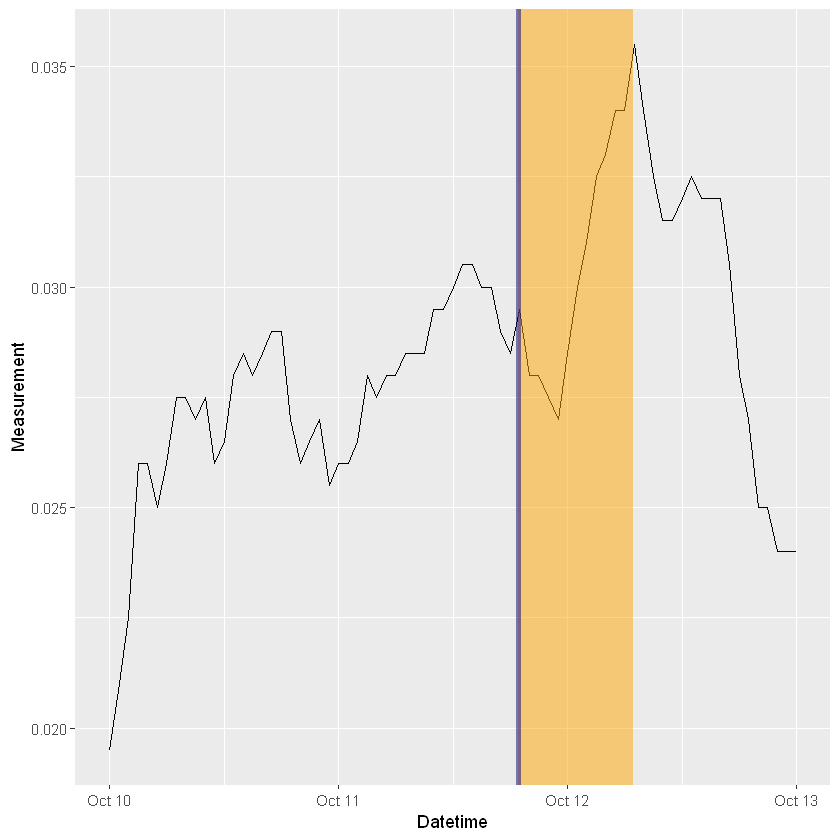

In [87]:
visualizr(11)

In [88]:
Nitrogen_Data<-read_csv('The Four Gases in Cohorts//Nitrogen Dioxide//Nitrogen Dioxide levels from 2016 to 2018.csv')

Parsed with column specification:
cols(
  .default = col_character(),
  State.Code = col_integer(),
  County.Code = col_integer(),
  Site.Num = col_integer(),
  Parameter.Code = col_integer(),
  POC = col_integer(),
  Latitude = col_double(),
  Longitude = col_double(),
  Date.Local = col_date(format = ""),
  Observation.Count = col_integer(),
  Observation.Percent = col_integer(),
  Arithmetic.Mean = col_double(),
  X1st.Max.Value = col_double(),
  X1st.Max.Hour = col_integer(),
  AQI = col_integer(),
  Method.Code = col_integer(),
  Date.of.Last.Change = col_date(format = "")
)
See spec(...) for full column specifications.


In [89]:
head(Nitrogen_Data)

State.Code,County.Code,Site.Num,Parameter.Code,POC,Latitude,Longitude,Datum,Parameter.Name,Sample.Duration,...,AQI,Method.Code,Method.Name,Local.Site.Name,Address,State.Name,County.Name,City.Name,CBSA.Name,Date.of.Last.Change
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,4,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,25,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,19,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,6,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,26,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22
1,73,23,42602,1,33.55306,-86.815,WGS84,Nitrogen dioxide (NO2),1 HOUR,...,32,200,Teledyne-API Model 200EUP or T200UP - Photolytic-Chemiluminescence,North Birmingham,"NO. B'HAM,SOU R.R., 3009 28TH ST. NO.",Alabama,Jefferson,Birmingham,"Birmingham-Hoover, AL",2017-03-22


In [90]:
names(Nitrogen_Data)

[1] "State.Code"          "County.Code"         "Site.Num"           
 [4] "Parameter.Code"      "POC"                 "Latitude"           
 [7] "Longitude"           "Datum"               "Parameter.Name"     
[10] "Sample.Duration"     "Pollutant.Standard"  "Date.Local"         
[13] "Units.of.Measure"    "Event.Type"          "Observation.Count"  
[16] "Observation.Percent" "Arithmetic.Mean"     "X1st.Max.Value"     
[19] "X1st.Max.Hour"       "AQI"                 "Method.Code"        
[22] "Method.Name"         "Local.Site.Name"     "Address"            
[25] "State.Name"          "County.Name"         "City.Name"          
[28] "CBSA.Name"           "Date.of.Last.Change"

In [91]:
unique(Nitrogen_Data$Units.of.Measure)

[1] "Parts per billion"

In [92]:
class(Nitrogen_Data$Units.of.Measure)

[1] "character"

In [93]:
Nitrogen_Data$Arithmetic.Mean<-Nitrogen_Data$Arithmetic.Mean/1000

In [94]:
Nitrogen_Data<-Nitrogen_Data[c('Latitude', 'Longitude', 'Date.Local', 'Arithmetic.Mean', 'AQI')]

In [95]:
head(Nitrogen_Data)

Latitude,Longitude,Date.Local,Arithmetic.Mean,AQI
33.55306,-86.815,2016-01-01,0.002520833,4
33.55306,-86.815,2016-01-02,0.008437500,25
33.55306,-86.815,2016-01-03,0.012750000,19
33.55306,-86.815,2016-01-04,0.003141667,6
33.55306,-86.815,2016-01-05,0.009316667,26
33.55306,-86.815,2016-01-06,0.014587500,32


In [96]:
names(Nitrogen_Data)[c(3:5)]<-c('Date', 'Nitrogen.Mean', "Nitrogen.AQI")

In [97]:
names(Ozone_Data)

[1] "Latitude"        "Longitude"       "Date"            "Arithmetic.Mean"
[5] "AQI"             "County"          "Zone"

In [98]:
names(Ozone_Data)[c(4,5)]<-c('Ozone.Mean', "Ozone.AQI")

In [99]:
Gas_Data<-merge(Ozone_Data, Nitrogen_Data, by=c('Longitude', 'Latitude', 'Date'))

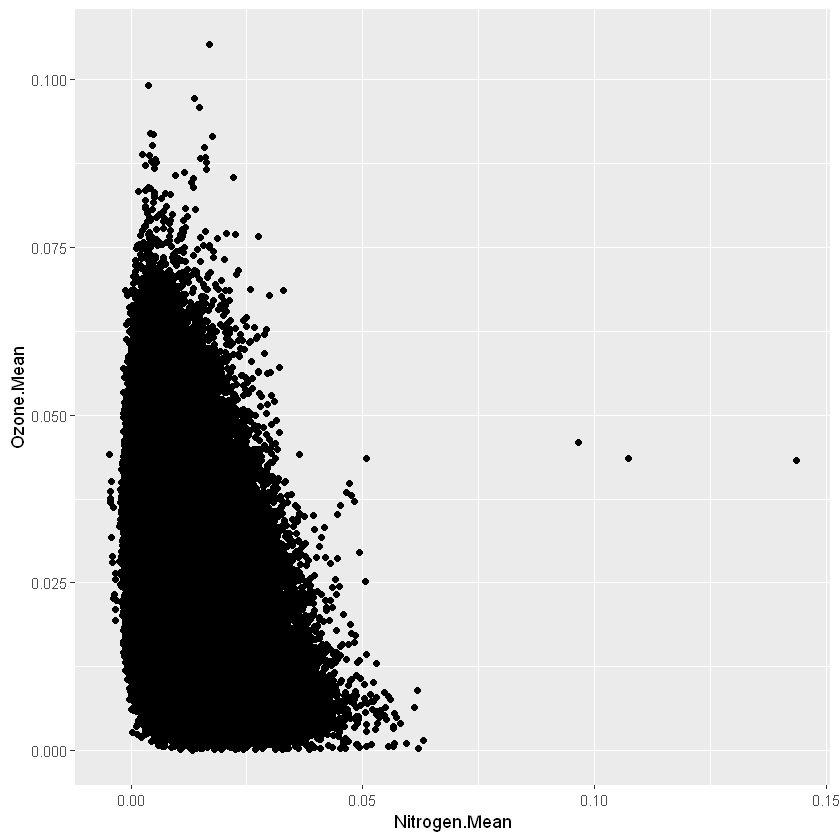

In [100]:
ggplot(data=Gas_Data, aes(x=Nitrogen.Mean, y=Ozone.Mean)) + geom_point()

Warning message:
"Removed 2493 rows containing missing values (geom_point)."

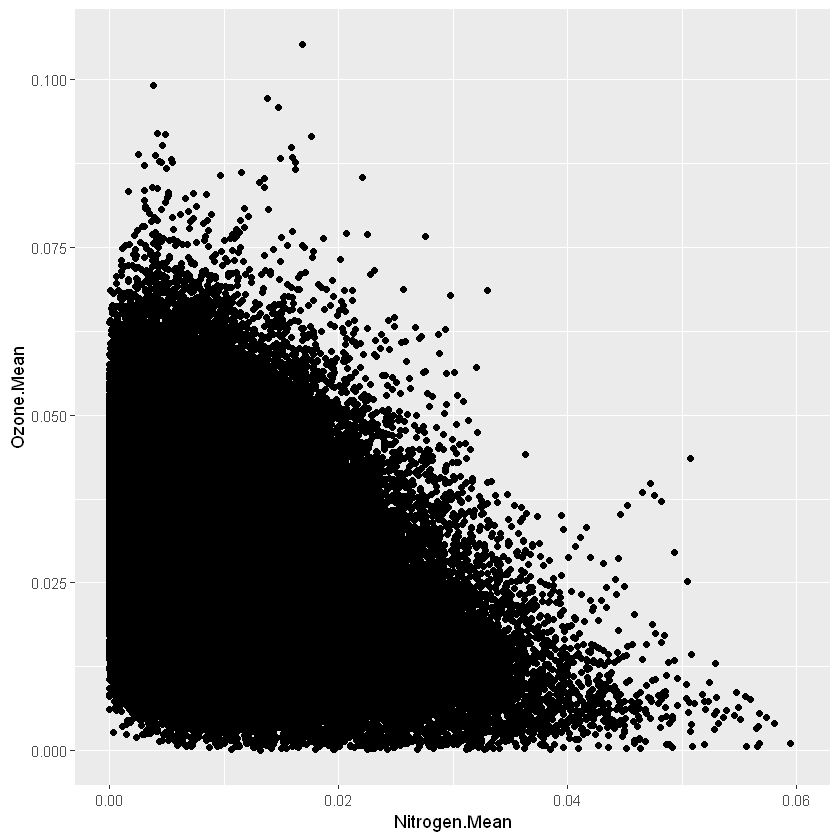

In [101]:
ggplot(data=Gas_Data, aes(x=Nitrogen.Mean, y=Ozone.Mean)) + geom_point() + xlim(0, 0.06)

Warning message:
"Removed 2493 rows containing missing values (geom_point)."

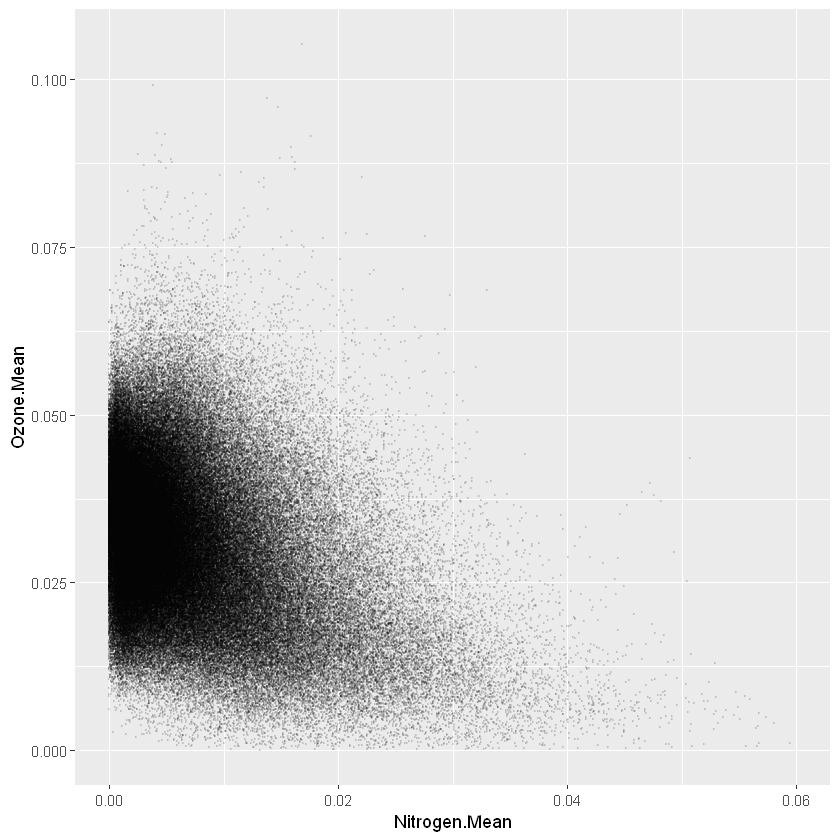

In [102]:
GasPlot<-ggplot(data=Gas_Data, aes(x=Nitrogen.Mean, y=Ozone.Mean)) + geom_point(size=0.01, alpha=0.1) + xlim(0, 0.06)
GasPlot

Warning message:
"Removed 2493 rows containing non-finite values (stat_smooth)."Warning message:
"Removed 2493 rows containing missing values (geom_point)."

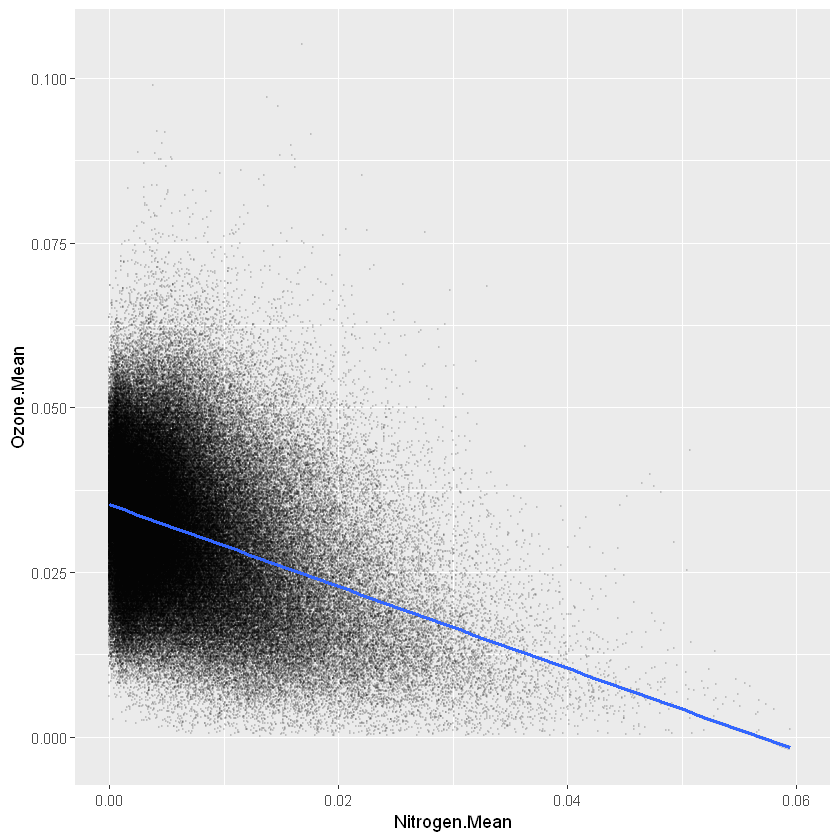

In [103]:
GasPlot + geom_smooth(method='lm')

In [104]:
xy.covar<-cov(Gas_Data$Nitrogen.Mean, Gas_Data$Ozone.Mean, )
x.var<-var(Gas_Data$Nitrogen.Mean)

In [105]:
lin.slope=xy.covar/x.var

In [106]:
lin.y.int<-mean(Gas_Data$Ozone.Mean) - mean(Gas_Data$Nitrogen.Mean)*lin.slope

Warning message:
"Removed 2493 rows containing missing values (geom_point)."

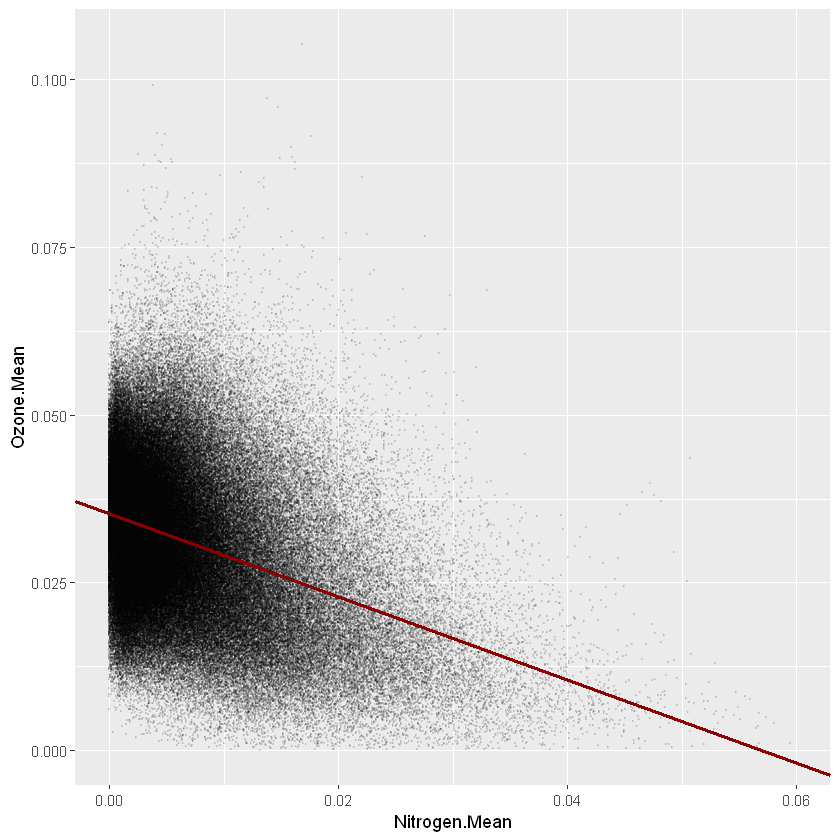

In [107]:
GasPlot + geom_abline(slope=lin.slope, intercept=lin.y.int, size=1, col='darkred')

In [108]:
GasPlot <- GasPlot + geom_abline(slope=lin.slope, intercept=lin.y.int, size=1, col='darkred')

In [109]:
get_r<-function(x,y)
{
    top<-(length(x)*sum(x*y)) - (sum(x)*sum(y))
    bottom<-(length(x)*sum(x^2)-sum(x)^2)*(length(y)*sum(y^2)-sum(y)^2)
    print(top)
    print(bottom)
    return(top/bottom)
}

In [110]:
get_r(Gas_Data$Nitrogen.Mean, Gas_Data$Ozone.Mean)->r.cof

[1] -1615233
[1] 2.019173e+13


In [111]:
r.cof

[1] -7.999476e-08

In [112]:
lin.info<-paste('Slope:', round(lin.slope, 3), '\n Y-Int:', round(lin.y.int, 3), '\n R:', round(r.cof, 10), '\n R-Squared:', round((r.cof)^2, 17))
lin.info

[1] "Slope: -0.616 \n Y-Int: 0.035 \n R: -8e-08 \n R-Squared: 6.4e-15"

Warning message:
"Removed 2493 rows containing missing values (geom_point)."

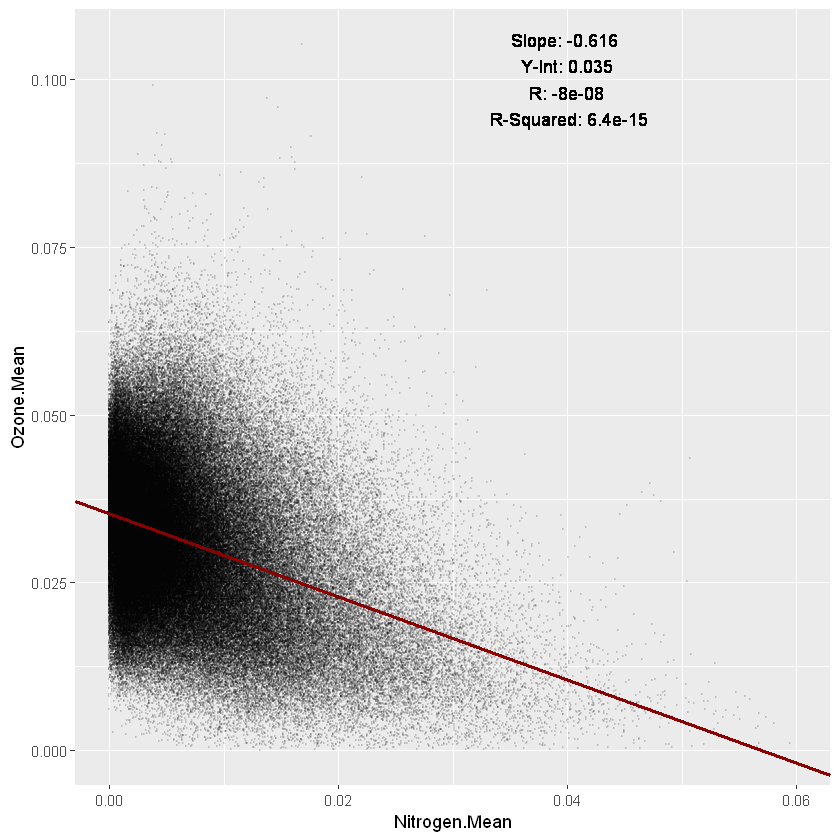

In [113]:
GasPlot + geom_text(inherit.aes=FALSE, aes(x=0.04, y=0.1, label=lin.info))